<div align="center">
    <font color="0F5298" size="7">
        Deep Learning <br>
    </font>
    <font color="2565AE" size="5">
        CE Department <br>
        Spring 2024 - Prof. Soleymani Baghshah <br>
    </font>
    <font color="3C99D" size="5">
        HW2 Practical <br>
    </font>
    <font color="696880" size="5">
        30 Points
    </font>
</div>


In [ ]:
FULLNAME = 'Reza Ghorbani Paji'
STD_ID = '403206565'

# Q3. License Plate Detection and Recognition (30 points)

## Introduction

In this assignment, we will build a two-stage license plate recognition system:

1. First stage: Detect license plates in an image (license plate detection / LPD)
2. Second stage: Recognize characters within the detected license plate (license plate recognition / LPR)

This approach is not explicitly an OCR (Optical Character Recognition), but it has some similarities with important differences. Unlike general OCR which often relies on sequence models (like RNNs or Transformers) to capture language context, license plates have a fixed format with predictable structure. This allows us to use multi-class classification or object detection models for it - first to locate plates, then to locate and classify individual characters.

## Background on YOLO (You Only Look Once)

### Evolution of Object Detection

Object detection has evolved significantly over the years:
- **Two-stage detectors** (like R-CNN family): First propose regions, then classify them
- **Single-stage detectors** (like YOLO and SSD): Predict bounding boxes and classes in a single forward pass

YOLO revolutionized object detection by framing it as a regression problem rather than a classification problem. Instead of generating region proposals and then classifying each region (a slow, two-stage process), YOLO divides the image into a grid and predicts bounding boxes and class probabilities directly in a single forward pass.

### YOLO Architecture

![YOLO Architecture](https://velog.velcdn.com/images/hunniee_j/post/cbd3888c-8b75-4325-988f-eadaded84232/image.JPG)

The basic YOLO approach:

1. **Grid Division**: Divide the image into an S×S grid
2. **Bounding Box Prediction**: Each grid cell predicts B bounding boxes, each with 5 parameters (x, y, w, h, confidence)
3. **Class Prediction**: Each grid cell also predicts class probabilities
4. **Non-Maximum Suppression**: Remove overlapping boxes with lower confidence scores

for a brief explanation of Object detection from RCNN to yolo version8 visit this [link](https://youtube.com/playlist?list=PL8VDJoEXIjppNvOzocFbRciZBrtSMi81v&si=qIh3VagQOzgWZ7Go)

the latest version of yolo is YOLO 12 and [here](https://docs.ultralytics.com/models/yolo12/) is Ultralytics documentation about it (all models of yolo family available in ultralytics has accessible documentation  [here](https://docs.ultralytics.com/models/) too.)


## Ultralytics Framework

Ultralytics is a Python library that makes it easy to train, test, and deploy YOLO models. Key features:

- **Easy to use API**: Simple Python API for training, validation, and inference
- **Pre-trained models**: Various pre-trained models of different sizes (nano to extra large)
- **Export options**: Export to various formats (ONNX, TFLite, CoreML, etc.)
- **Multi-task learning**: Support for object detection, segmentation, and pose estimation



## Assignment Tasks

In this assignment, you will:

1. Train a YOLO model for license plate detection on LPD dataset
2. Train a CNN model for license plate recognition within LPR license plates (7 digit + 1 letter classificaiton task)
3. Create an end-to-end pipeline that connects step 1 with 2
4. Evaluate the performance of your system on the test data


The dataset are available in [this](https://drive.google.com/drive/folders/1StRhbI28MaoiuXqA2rG5vGqKG5K2bMW6?usp=sharing) drive folder. let's dive into it!



In [8]:
#Necessary installations

%pip install -q ultralytics
%pip install -q matplotlib opencv-python pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.8 MB/s eta 0:00:00


In [9]:
import gdown
import zipfile
import os
file_id = "1vVFtkxmyk0V55t4ANx15mKptHpYgEURl"
url = f"https://drive.google.com/uc?id={file_id}"
output = "LPD.zip"
gdown.download(url, output, quiet=False)
with zipfile.ZipFile('LPD.zip', 'r') as zip_ref:
    zip_ref.extractall('IR-LPD')

Downloading...
From (original): https://drive.google.com/uc?id=1vVFtkxmyk0V55t4ANx15mKptHpYgEURl
From (redirected): https://drive.google.com/uc?id=1vVFtkxmyk0V55t4ANx15mKptHpYgEURl&confirm=t&uuid=13192a1c-4f7a-406f-a786-ee54376c4a59
To: /content/LPD.zip
100%|██████████| 3.76G/3.76G [01:45<00:00, 35.8MB/s]


In [10]:
file_id = "1mwaRZwaP5bYW5N4f-RQu7NIk2xrURGt0"
url = f"https://drive.google.com/uc?id={file_id}"
output = "LPR.zip"
gdown.download(url, output, quiet=False)
with zipfile.ZipFile('LPR.zip', 'r') as zip_ref:
    zip_ref.extractall('IR-LPR')

Downloading...
From (original): https://drive.google.com/uc?id=1mwaRZwaP5bYW5N4f-RQu7NIk2xrURGt0
From (redirected): https://drive.google.com/uc?id=1mwaRZwaP5bYW5N4f-RQu7NIk2xrURGt0&confirm=t&uuid=d1bb571a-ea0c-4637-acb8-a0e709c741d8
To: /content/LPR.zip
100%|██████████| 256M/256M [00:04<00:00, 54.0MB/s]


In [11]:
#imports

import os
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from ultralytics import YOLO
import random
import pandas as pd
import pandas as pd
from PIL import Image
import torch
from torchvision import transforms
from IPython.display import display
import pandas as pd
import torch.utils.data as data
import torch
from tqdm import tqdm
import torch.optim as optim
import torch
import torch.nn as nn
from torchvision import models
import cv2
import shutil
import yaml
from pathlib import Path


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [13]:
BASE_PATH = '/content'

### 1. LPD - YOLO

In [14]:
LPD_RELATIVE_PATH = 'IR-LPD'
LPD_DIR = f'{BASE_PATH}/{LPD_RELATIVE_PATH}'

images_dir = os.path.join(LPD_DIR, 'images')
labels_dir = os.path.join(LPD_DIR, 'labels')

In [15]:
image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

print(f"Dataset contains {len(image_files)} images and {len(label_files)} labels")


objects_count = 0
for label_file in [os.path.join(labels_dir, f) for f in label_files]:
    with open(label_file, 'r') as f:
        objects_count += len(f.readlines())

print(f"Total license plates in dataset: {objects_count}")
print(f"Average plates per image: {objects_count / max(1, len(image_files)):.2f}")

Dataset contains 6252 images and 6252 labels
Total license plates in dataset: 7257
Average plates per image: 1.16


<font color="orange">
1. What is the structure of YOLO's label files (`.txt`), and why are bounding box coordinates normalized?<br>
<font color="white">
YOLO's label files (.txt) contain one line per object, formatted as:<br>
[class_id, x_center, y_center, width, height], where coordinates are normalized (0–1) relative to image width/height. Normalization ensures consistency across varying image sizes and simplifies training on resized inputs.
<font color="orange">
<br>2. How does the YAML configuration file in YOLO define a dataset, and what role does the `nc` (number of classes) parameter play?  
<font color="white">
<br>The YAML file defines dataset paths (train/val image directories), class names, and nc (number of classes). The nc parameter determines the model’s output layer size, ensuring predictions align with the dataset’s class count.
<font color="orange">
<br>3. Why does YOLO use a grid system for predictions, and how does it handle multiple objects in a single grid cell?  
<font color="white">
<br>
YOLO uses a grid system to spatially localize objects: each grid cell predicts bounding boxes for objects whose centers fall within it. To handle multiple objects in a single cell, anchor boxes (predefined aspect ratios) are assigned per cell, allowing each cell to predict multiple objects
</font>


In [16]:
# you must create a yaml file there is just one class object detection and you must split the dataset into two parts (80%-20% for train and val)
# the executed result of cell is belong to train = val = all data for better understanding about the YOLO results.


YAML_PATH =  os.path.join(LPD_DIR, 'data.yaml')

In [17]:
import random
import shutil
from pathlib import Path

for split in ['train', 'val']:
    os.makedirs(os.path.join(images_dir, split), exist_ok=True)
    os.makedirs(os.path.join(labels_dir, split), exist_ok=True)

image_files = sorted([f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])
random.shuffle(image_files)
split_index = int(0.8 * len(image_files))
train_files = image_files[:split_index]
val_files = image_files[split_index:]

for img_file in train_files:
    label_file = img_file.replace('.jpg', '.txt')
    shutil.copy(os.path.join(images_dir, img_file), os.path.join(images_dir, 'train', img_file))
    shutil.copy(os.path.join(labels_dir, label_file), os.path.join(labels_dir, 'train', label_file))

for img_file in val_files:
    label_file = img_file.replace('.jpg', '.txt')
    shutil.copy(os.path.join(images_dir, img_file), os.path.join(images_dir, 'val', img_file))
    shutil.copy(os.path.join(labels_dir, label_file), os.path.join(labels_dir, 'val', label_file))

yaml_dict = {
    'train':  os.path.join(images_dir, 'train'),
    'val': os.path.join(images_dir, 'val'),
    'names': ['plate'],
    'nc': 1
}

with open(YAML_PATH, 'w') as f:
    yaml.dump(yaml_dict, f)


In [18]:
VERSION = '12'
MODEL_SIZE = 'n'  # Options: n, s, m, l, x
EPOCHS = 20
IMGSZ = 640
BATCH = 16
DEVICE = '0'

<font color="orange">
Compare the architectural and functional advancements in YOLO versions 8 through 12. Specifically:  

1. **YOLOv8**:  
   - What was the motivation behind adopting an anchor-free design, and how did this impact training complexity and performance?  
        - YOLOv8–v12 shifted to anchor-free detection (motivated by reducing hyperparameter dependency and improving generalization). By eliminating predefined anchor boxes, they simplified the model architecture and training pipeline (no anchor clustering/tuning), reducing computational overhead. This design:

            - Improved performance on small/overlapping objects (via direct coordinate regression).

            - Reduced training complexity (no anchor-matching steps) but required refined loss functions (e.g., CIoU, distribution focal loss) to stabilize training.

            - v9+ enhanced this with dynamic label assignment (e.g., Task-Aligned Assigner) and hybrid architectures (CNN + transformer modules in v12), balancing speed and accuracy.

   - How did the integration of CSPDarknet and PANet improve feature extraction and multi-scale detection compared to earlier versions?  

        - YOLO's integration of CSPDarknet (Cross Stage Partial Network) and PANet (Path Aggregation Network) significantly improved feature extraction and multi-scale detection: CSPDarknet splits feature maps into two paths (dense computation + identity) to reduce redundancy and computational costs (~20% fewer FLOPs) while enhancing gradient flow, enabling richer feature learning, while PANet augments FPN by adding a bottom-up pathway alongside the top-down fusion, enabling bidirectional integration of low-level spatial details (e.g., edges) and high-level semantics for stronger multi-scale detection—particularly for small objects—surpassing earlier versions like YOLOv3, which lacked these mechanisms, resulting in higher average precision (AP) and balanced speed-accuracy trade-offs.

2. **YOLOv9 (Hypothetical/Unofficial)**:  
   - If YOLOv9 introduced dynamic label assignment, how does this differ from static assignment in YOLOv8, and what are the implications for model accuracy and convergence speed?  
        - YOLOv9’s dynamic label assignment adaptively matches predictions to ground truth during training (based on prediction quality and task alignment), unlike YOLOv8’s static assignment (fixed IoU/anchors), improving accuracy by prioritizing high-quality candidates and accelerating convergence through context-aware optimization, reducing manual hyperparameter tuning.   
   - What role might lightweight model variants (e.g., YOLOv9n) play in edge-device deployment, and how were they optimized for resource-constrained environments?  
        - Lightweight YOLO variants (e.g., YOLOv9n) enable edge deployment by reducing model size/compute via architectural optimizations—such as streamlined backbones (fewer layers/channels), depthwise convolutions, and quantization (FP16/INT8)—balancing speed and accuracy for real-time inference on low-power devices (e.g., drones, IoT), while techniques like dynamic label assignment and knowledge distillation retain performance despite resource constraints.

3. **YOLOv10**:  
   - How did hybrid loss functions (e.g., combining CIoU and focal loss) enhance the training process, and what challenges in object detection were they designed to address?  
        - YOLOv10's hybrid loss (CIoU + focal loss) improves training by combining precise geometric alignment (CIoU’s focus on overlap, center distance, and aspect ratio) with class imbalance mitigation (focal loss’s emphasis on hard examples). This addresses challenges like accurate small-object localization and handling datasets with uneven class distributions.   
   - What advancements in model pruning and quantization were introduced, and how did these techniques reduce model size without compromising accuracy?  
        - YOLOv10 introduced structured pruning (systematically removing redundant channels/layers) and quantization-aware training (e.g., INT8 precision with calibration), reducing model size and computational demands. These methods preserved accuracy through iterative optimization and knowledge distillation, enabling efficient deployment on edge devices without significant performance loss.
4. **YOLOv11**:  
   - In what ways did self-calibrated convolutions improve feature extraction, and how do they compare to traditional convolutional layers in terms of computational efficiency and accuracy?  
        - YOLOv11’s self-calibrated convolutions enhanced feature extraction by dynamically adjusting kernel weights based on input context, improving adaptability to object scales and orientations. Compared to traditional convolutions, they maintained computational efficiency through parameter sharing and reduced redundancy, boosting accuracy (especially for complex scenes) with minimal FLOPs overhead.
   - How did the introduction of multi-task learning (e.g., joint object detection and segmentation) expand the capabilities of YOLOv11, and what new applications does this enable?  
        - By integrating multi-task learning (joint detection and segmentation), YOLOv11 unified spatial and semantic understanding, enabling applications like panoptic scene parsing (e.g., autonomous vehicles mapping object boundaries) and medical imaging (tumor detection + segmentation). This required shared backbone optimization and balanced loss weighting, expanding utility while retaining real-time efficiency.

5. **YOLOv12**:  
   - What benefits does the integration of transformer-based modules bring to YOLOv12, and how does this hybrid architecture balance the strengths of CNNs and transformers?  
        - YOLOv12 integrates transformer-based modules (e.g., self-attention layers) into its CNN backbone to capture long-range dependencies and global context, enhancing detection in cluttered/scaled scenes. The hybrid architecture balances CNNs’ efficiency in local feature extraction with transformers’ contextual reasoning, maintaining real-time speed while boosting accuracy for complex spatial relationships.
   - How does uncertainty estimation in YOLOv12 improve the reliability of predictions, particularly in safety-critical applications like autonomous driving or medical imaging?
        - Uncertainty estimation in YOLOv12 quantifies prediction confidence (e.g., via Bayesian networks or ensemble methods), flagging low-confidence detections. This improves reliability in safety-critical fields (e.g., autonomous driving avoids misclassifying obscured pedestrians; medical imaging flags ambiguous tumor regions) by enabling fallback protocols or human oversight.
   - Discuss the role of domain adaptation techniques in YOLOv12 and how they address challenges like dataset bias or environmental variability.  
        - YOLOv12 employs domain adaptation (e.g., adversarial training, feature alignment) to minimize dataset bias and environmental shifts (e.g., day-to-night lighting). By aligning feature distributions across domains, it generalizes better to unseen scenarios (e.g., cross-camera surveillance, rural/urban driving), reducing retraining needs and enhancing robustness.

Based on these advancements, which version would you recommend for this aplication, and why?  
    - Recommendation: YOLOv12 is ideal for safety-critical, dynamic environments (e.g., autonomous driving, medical imaging) due to:

1.    Transformer-CNN Hybrid: Balances real-time efficiency (CNNs) with contextual reasoning (transformers), excelling in cluttered/scaled scenes (e.g., urban traffic).

2.    Uncertainty Estimation: Flags low-confidence predictions, enabling fail-safes (e.g., alerting drivers about ambiguous obstacles).

3.    Domain Adaptation: Reduces dataset/environment bias (e.g., adapting to night/day shifts), minimizing retraining for edge cases.While lightweight variants (v9n/v10n) suit edge devices, v12’s robustness, adaptability, and reliability make it superior for applications demanding precision in unpredictable conditions.


</font>

In [19]:
LPD_model = f'yolo12{MODEL_SIZE}.pt'

In [20]:
if not os.path.exists(LPD_model):
    YOLO(f'yolo{VERSION}{MODEL_SIZE}').load(LPD_model)  # Download the pre-trained weights
    print(f"Downloaded pre-trained model: {LPD_model}")

100%|██████████| 5.34M/5.34M [00:00<00:00, 343MB/s]


Transferred 699/699 items from pretrained weights
Downloaded pre-trained model: yolo12n.pt


In [ ]:

print(f"Starting YOLO{VERSION}{MODEL_SIZE} training for {EPOCHS} epochs...")

model = YOLO(LPD_model)
model.train(data=YAML_PATH,
            epochs=EPOCHS,
            imgsz=IMGSZ,
            batch=BATCH,
            device=DEVICE,
            project=f'{BASE_PATH}/model/LPD',
            name=f'yoloV{VERSION}{MODEL_SIZE}',
            verbose=True)

print("Training complete! Model saved to model/LPD folder.")

Starting YOLO12n training for 20 epochs...
Ultralytics 8.3.98 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=/content/IR-LPD/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/model/LPD, name=yoloV12n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

100%|██████████| 755k/755k [00:00<00:00, 41.5MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 181MB/s]


AMP: checks passed ✅


train: Scanning /content/IR-LPD/labels/train... 6005 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6005/6005 [00:16<00:00, 368.25it/s]


train: New cache created: /content/IR-LPD/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/IR-LPD/labels/val... 2255 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2255/2255 [00:04<00:00, 534.38it/s]

val: New cache created: /content/IR-LPD/labels/val.cache


Plotting labels to /content/model/LPD/yoloV12n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/model/LPD/yoloV12n
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.41G      1.219      1.645      1.036         13        640: 100%|██████████| 376/376 [03:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:42<00:00,  1.68it/s]


                   all       2255       2609      0.919      0.844      0.905       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.23G      1.182     0.9172      1.019          6        640: 100%|██████████| 376/376 [03:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:39<00:00,  1.80it/s]

                   all       2255       2609      0.931      0.898      0.921      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.23G      1.159     0.7887      1.015         15        640: 100%|██████████| 376/376 [03:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:41<00:00,  1.71it/s]


                   all       2255       2609      0.919      0.902      0.935      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.23G      1.114     0.7296      1.001         10        640: 100%|██████████| 376/376 [03:07<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.84it/s]

                   all       2255       2609      0.932      0.905      0.943      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      4.25G      1.082     0.6793     0.9864          5        640: 100%|██████████| 376/376 [03:05<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.86it/s]

                   all       2255       2609      0.927      0.923      0.953      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.26G      1.032     0.6386     0.9753         10        640: 100%|██████████| 376/376 [03:04<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.83it/s]

                   all       2255       2609      0.929      0.892      0.934       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.28G     0.9994     0.6089     0.9621         10        640: 100%|██████████| 376/376 [03:04<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.83it/s]


                   all       2255       2609      0.936       0.91       0.95      0.677

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      4.29G     0.9921     0.6002     0.9616         13        640: 100%|██████████| 376/376 [03:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:39<00:00,  1.81it/s]

                   all       2255       2609      0.935       0.92      0.956      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      4.31G     0.9768     0.5838     0.9578         10        640: 100%|██████████| 376/376 [03:04<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.85it/s]

                   all       2255       2609      0.929      0.917       0.95      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      4.32G     0.9561     0.5677     0.9556          6        640: 100%|██████████| 376/376 [03:02<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.85it/s]

                   all       2255       2609      0.932      0.918      0.961      0.711


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.34G     0.9085     0.5297     0.9422          5        640: 100%|██████████| 376/376 [03:00<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:39<00:00,  1.82it/s]

                   all       2255       2609      0.945      0.919       0.96       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      4.35G     0.8965     0.5126      0.938          5        640: 100%|██████████| 376/376 [02:58<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.87it/s]

                   all       2255       2609      0.943      0.912      0.962      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      4.37G     0.8873     0.5042     0.9335          8        640: 100%|██████████| 376/376 [02:56<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.87it/s]

                   all       2255       2609      0.944      0.921      0.961      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      4.38G     0.8698     0.4954     0.9276          5        640: 100%|██████████| 376/376 [02:56<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.88it/s]

                   all       2255       2609      0.938      0.926      0.961      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       4.4G     0.8451     0.4802      0.925          9        640: 100%|██████████| 376/376 [02:56<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.90it/s]

                   all       2255       2609      0.949      0.927      0.965      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      4.41G     0.8341     0.4613      0.925          5        640: 100%|██████████| 376/376 [02:55<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.88it/s]

                   all       2255       2609      0.941      0.926      0.967      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      4.43G     0.8217     0.4531     0.9162          5        640: 100%|██████████| 376/376 [02:55<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.87it/s]


                   all       2255       2609      0.952      0.938      0.976      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      4.44G     0.8018     0.4363     0.9125          6        640: 100%|██████████| 376/376 [02:55<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.88it/s]

                   all       2255       2609      0.945      0.934       0.97       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      4.46G     0.7895     0.4253     0.9074          5        640: 100%|██████████| 376/376 [02:55<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:38<00:00,  1.84it/s]


                   all       2255       2609      0.955      0.932      0.972      0.762

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      4.47G      0.774     0.4105     0.9032          5        640: 100%|██████████| 376/376 [02:54<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:37<00:00,  1.88it/s]

                   all       2255       2609      0.945      0.944      0.973      0.768



20 epochs completed in 1.235 hours.
Optimizer stripped from /content/model/LPD/yoloV12n/weights/last.pt, 5.5MB
Optimizer stripped from /content/model/LPD/yoloV12n/weights/best.pt, 5.5MB

Validating /content/model/LPD/yoloV12n/weights/best.pt...
Ultralytics 8.3.98 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 71/71 [00:39<00:00,  1.81it/s]


                   all       2255       2609      0.945      0.944      0.973      0.768
Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /content/model/LPD/yoloV12n
Training complete! Model saved to model/LPD folder.


Testing model on sample images...

image 1/1 /content/IR-LPD/images/006009.jpg: 640x384 1 plate, 85.4ms
Speed: 2.8ms preprocess, 85.4ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 384)


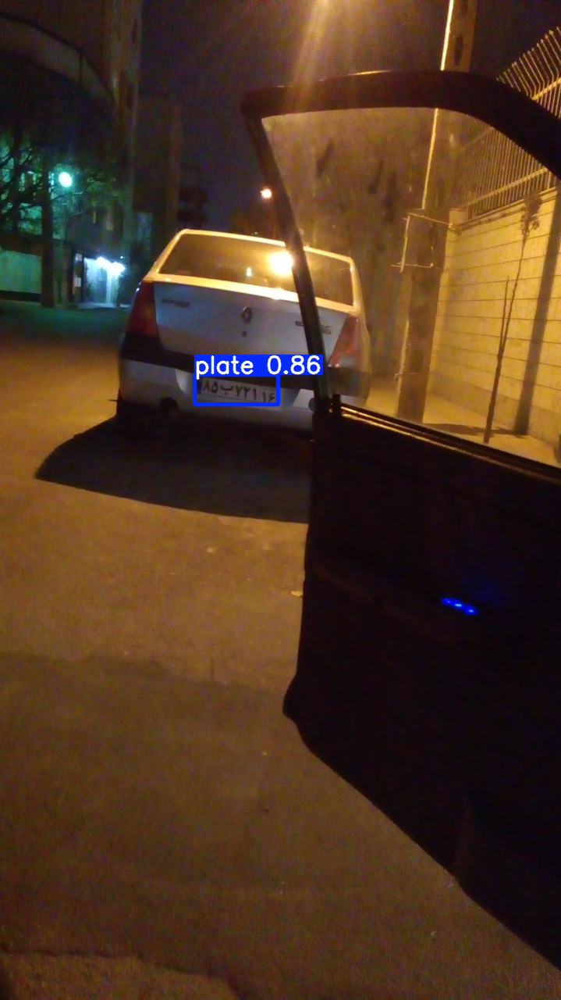


image 1/1 /content/IR-LPD/images/003968.jpg: 352x640 1 plate, 88.9ms
Speed: 3.2ms preprocess, 88.9ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)


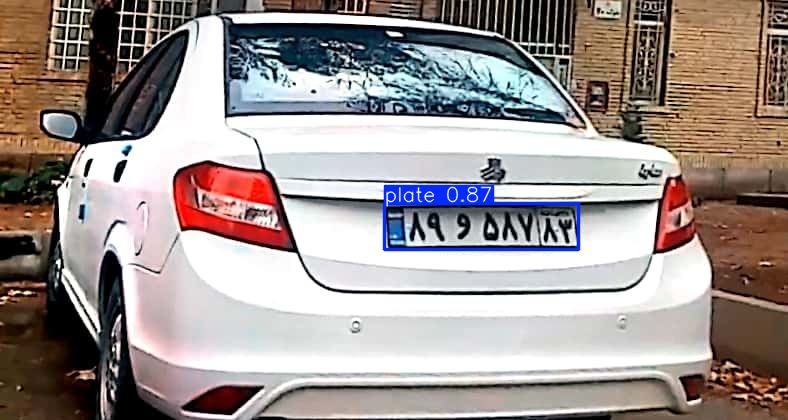


image 1/1 /content/IR-LPD/images/003864.jpg: 640x384 1 plate, 27.9ms
Speed: 2.9ms preprocess, 27.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)


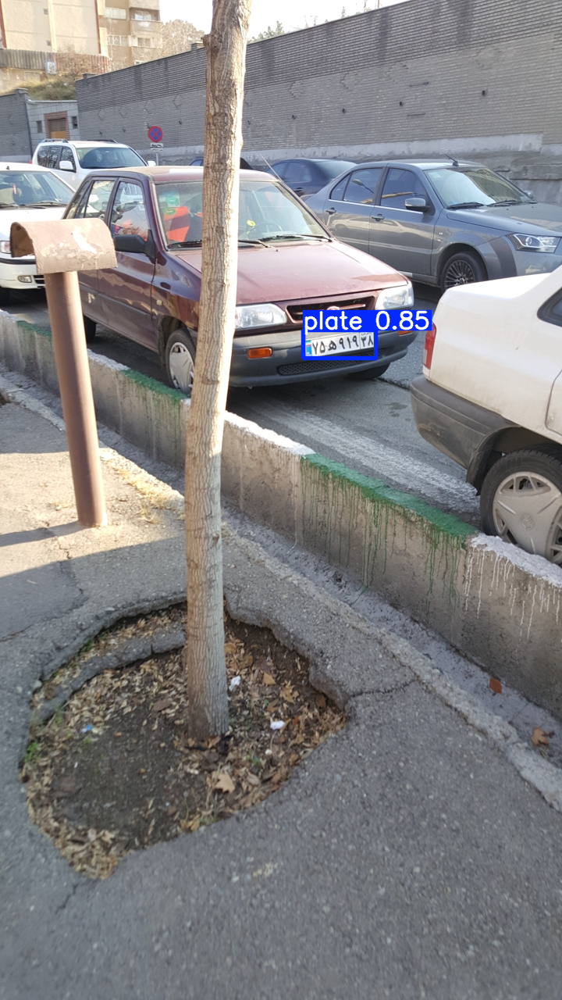


image 1/1 /content/IR-LPD/images/001316.jpg: 640x384 2 plates, 30.4ms
Speed: 2.7ms preprocess, 30.4ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 384)


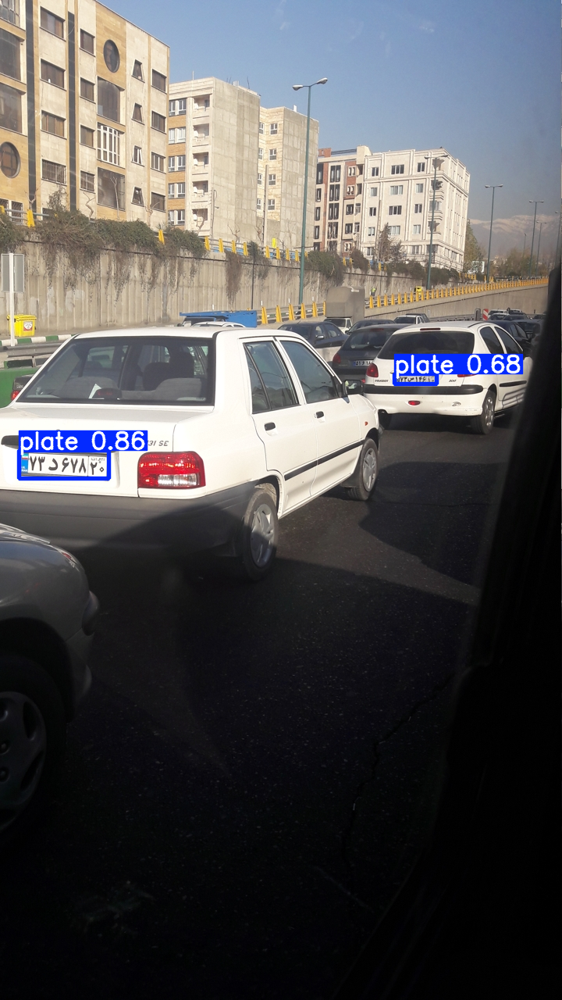


image 1/1 /content/IR-LPD/images/005766.jpg: 640x384 1 plate, 30.8ms
Speed: 2.5ms preprocess, 30.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


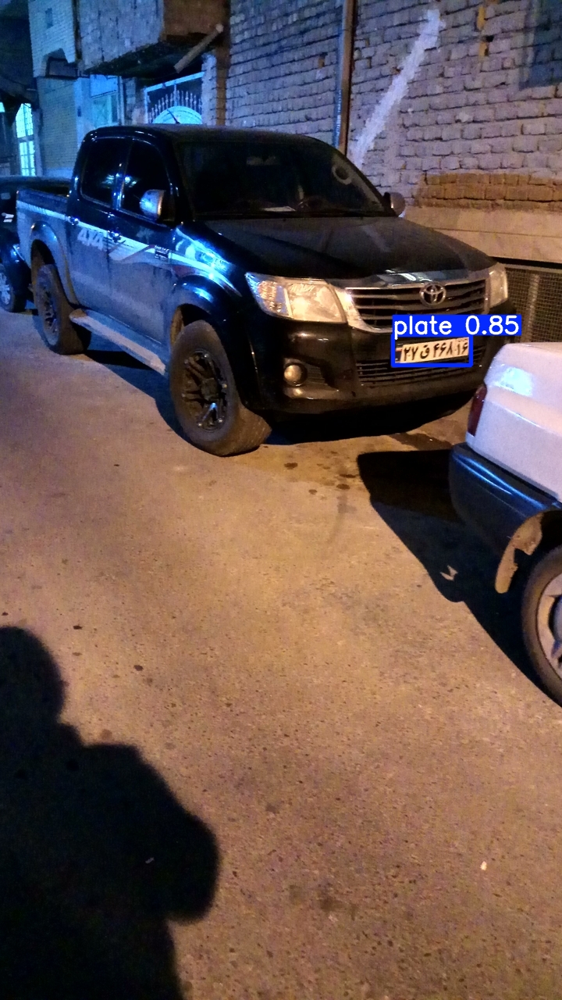

In [ ]:
%matplotlib inline

print("Testing model on sample images...")
for img_file in random.sample(image_files, 5):
    img_path = os.path.join(images_dir, img_file)

    results = model(img_path)

    for result in results:
        result.show()


### 2. LPR - CNN

In [21]:
LPR_RELATIVE_PATH = 'IR-LPR'

df = pd.read_csv(f'{BASE_PATH}/{LPR_RELATIVE_PATH}/valid_samples.csv')
df = df.sample(n=22000, random_state=42)

In [22]:
digit_vocabulary = "0123456789"
persian_letters = "آ ب پ ت ث ج چ ح خ د ذ ر ز ژ س ش ص ض ط ظ ع غ ف ق ک گ ل م ن و ه ی".split()


digit_to_idx = {char: idx for idx, char in enumerate(digit_vocabulary)}
letter_to_idx = {char: idx for idx, char in enumerate(persian_letters)}
idx_to_digit = {idx: char for idx, char in enumerate(digit_vocabulary)}
idx_to_letter = {idx: char for idx, char in enumerate(persian_letters)}


persian_to_english_digits = {
    '۰': '0', '۱': '1', '۲': '2', '۳': '3', '۴': '4',
    '۵': '5', '۶': '6', '۷': '7', '۸': '8', '۹': '9'
}

persian_letter_normalization = {
    "الف": "آ",
    "ا" : "آ",
    "ژ (معلولین و جانبازان)": "ژ",
    "ه‍" : "ه"
}



def translate(label):

    first_two_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[:2]])
    persian_letter = label[2]
    remaining_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[3:]])
    return first_two_digits + persian_letter + remaining_digits


def preprocess_sample(image_path, label , full_transform=True, log=False, dir_path = BASE_PATH , relative_path= f'{LPR_RELATIVE_PATH}/detections', language='en'):

    if language == 'fa' :
      label = translate(label)

    elif language != 'en':
          raise Exception('Un-supported language!')

    path = f'{dir_path}/{relative_path}'

    train_transform = transforms.Compose([
        transforms.Resize((64, 128)),
        transforms.RandomRotation(degrees=5),
        transforms.ColorJitter(brightness=0.3, contrast=0.3),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    test_transform = transforms.Compose([
        transforms.Resize((64, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])




    transform = train_transform if full_transform else test_transform
    image = Image.open(f'{path}/{image_path}').convert("RGB")
    image = transform(image)


    for key, value in persian_letter_normalization.items():
        label = label.replace(key, value)



    if log:
      print(label)

      for i , c in enumerate(label):
        if c in persian_letters:
          c = '*'
        print(f"{i}:{c}", end=' | ')

      print()


    digits = [digit_to_idx[char] for char in label if char.isdigit()]
    letter = letter_to_idx[label[2]]

    return image, digits, letter

In [23]:
class PLPRDataset(data.Dataset):
    def __init__(self, df , split='train',dir_path=BASE_PATH,relative_path = f'{LPR_RELATIVE_PATH}/detections', language='en'):
        self.df = df
        self.full_transform = True if split == 'train' else False
        self.dir_path = dir_path
        self.relative_path = relative_path
        self.language = language

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # todo
        row = self.df.iloc[idx]
        image_path = row['image_path']
        label = row['label']

        image, digits, letter = preprocess_sample(
            image_path=image_path,
            label=label,
            full_transform=self.full_transform,
            log=False,
            dir_path=self.dir_path,
            relative_path=self.relative_path,
            language=self.language
        )
        return {
            'image': image,
            'digits': torch.tensor(digits, dtype=torch.long),
            'letter': torch.tensor(letter, dtype=torch.long)
        }


In [24]:
import torchvision.models as models

class FCNPLPRModel(nn.Module):
    def __init__(self, backbone_name="efficientnet_b0"):
        # todo
        super(FCNPLPRModel, self).__init__()

        backbone = getattr(models, backbone_name)(pretrained=True)
        self.backbone = nn.Sequential(*list(backbone.children())[:-1])

        in_features = backbone.classifier[1].in_features

        self.digit_head = nn.Linear(in_features, 7 * 10)

        self.letter_head = nn.Linear(in_features, len(letter_to_idx))

    def forward(self, x):
        features = self.backbone(x)
        features = features.view(features.size(0), -1)

        digit_logits = self.digit_head(features)
        digit_outputs = digit_logits.view(-1, 7, 10)#digit_outputs  -> [batch_size, 7, 10]

        letter_output = self.letter_head(features)#letter_output -> [batch_size, num_persian_letters]

        return digit_outputs, letter_output


In [25]:
learning_rate = 4e-4
batch_size = 32

In [26]:
dataset = PLPRDataset(df)
dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
        # persistent_workers=True
)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [27]:
LPR_model = FCNPLPRModel().to(device)
digit_criterion = nn.CrossEntropyLoss()
letter_criterion = nn.CrossEntropyLoss()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 135MB/s]


In [28]:
optimizer = optim.AdamW(LPR_model.parameters(), lr=learning_rate)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2,
    threshold=0.05,
    threshold_mode='rel',
    verbose=True
)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [29]:
def decode_predictions(digit_outputs, letter_output):
    digit_predictions = torch.argmax(digit_outputs, dim=2)  # [batch_size, 7]
    batch_size = digit_predictions.size(0)

    digits = []
    for b in range(batch_size):  # Iterate over batch
        sample_digits = []
        for i in range(7):  # Iterate over 7 digits
            try:
                sample_digits.append(idx_to_digit[digit_predictions[b][i].item()])
            except KeyError as e:
                print(f"KeyError: {e} (digit_predictions[{b}][{i}] = {digit_predictions[b][i].item()})")
                sample_digits.append("?")  # Use a placeholder for invalid indices
        digits.append(sample_digits)

    letter_prediction = torch.argmax(letter_output, dim=1)  # [batch_size]
    letters = []
    for b in range(batch_size):
        try:
            letters.append(idx_to_letter[letter_prediction[b].item()])
        except KeyError as e:
            print(f"KeyError: {e} (letter_prediction[{b}] = {letter_prediction[b].item()})")
            letters.append("?")  # Use a placeholder for invalid indices

    labels = []
    for b in range(batch_size):
        label = "".join(digits[b][:2]) + letters[b] + "".join(digits[b][2:])
        labels.append(label)

    return labels



def evaluate_misclassification(gt, pred):
    assert len(gt) == len(pred), "GT and Pred must have the same length."

    # Collect misclassified characters
    misclassified = []
    char_error_count = 0

    for i, (gt_char, pred_char) in enumerate(zip(gt, pred)):
        if gt_char != pred_char:
            misclassified.append(f"{gt_char} with {pred_char} at pos {i}")
            char_error_count += 1

    # Format the output
    misclassified_str = " , ".join(misclassified) if misclassified else "None"
    result = (f"GT: {gt} | Pred: {pred} | "
              f"Misclassified: {misclassified_str} | "
              f"Char error count: {char_error_count}")

    return result , char_error_count





def calculate_accuracy(model, df, device, dir_path=BASE_PATH, relative_path=f'{LPR_RELATIVE_PATH}/detections', language='en', log=False , cer = False):
    model.eval()
    FP= []
    CE = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for _, row in tqdm(df.iterrows(), total=len(df)):
            image_path = row["image_path"]
            label = row["label"]
            try:
                image, true_digits, true_letter = preprocess_sample(image_path, label, full_transform=False, dir_path=dir_path, relative_path=relative_path, language=language)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")
                continue
            true_label = "".join([digit_vocabulary[d] for d in true_digits[:2]]) \
                         + persian_letters[true_letter] \
                         + "".join([digit_vocabulary[d] for d in true_digits[2:]])
            image = image.unsqueeze(0).to(device)
            digit_outputs, letter_output = model(image)

            predicted_labels = decode_predictions(digit_outputs, letter_output)

            if predicted_labels[0] == true_label:
                correct += 1
            elif log:
                report , char_error_count = evaluate_misclassification(true_label,predicted_labels[0])
                CE += char_error_count
                FP.append(report)
            total += 1


    accuracy = correct / total * 100

    if cer:
        print(f'CER: {100* CE/(8*df.shape[0]): .4f}%')

    if log:
         for false_positive in FP:
            print(false_positive)



    return accuracy

In [24]:
full_df = pd.read_csv(f'{BASE_PATH}/IR-LPR/valid_samples.csv')
test_df = full_df.loc[~full_df.index.isin(df.index)]


In [ ]:
best_accuracy = 85.0
optimal_weights = None
num_epochs = 10


for epoch in range(num_epochs):
    LPR_model.train()
    total_loss = 0
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for batch in progress_bar:
        images = batch['image'].to(device)
        digit_targets = batch['digits'].to(device)
        letter_targets = batch['letter'].to(device)


        # Forward pass
        digit_outputs, letter_output = LPR_model(images)

        digit_loss = 0
        for i in range(7):
            digit_loss += digit_criterion(digit_outputs[:, i, :], digit_targets[:, i])
        letter_loss = letter_criterion(letter_output, letter_targets)
        loss = digit_loss + letter_loss

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    avg_loss = total_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

    LPR_model.eval()
    accuracy = calculate_accuracy(
        LPR_model,
        test_df,
        device,
        relative_path= f'{LPR_RELATIVE_PATH}/detections',
        language='en'
    )
    print(f"Accuracy after Epoch {epoch+1}: {accuracy:.2f}%")

    scheduler.step(accuracy)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        optimal_weights = LPR_model.state_dict()  # Save the current model weights
        print(f"New best accuracy: {best_accuracy:.2f}%. Saving model weights.")
        torch.save(LPR_model.state_dict(), f'{BASE_PATH}/model/PLPR-CNN.pth')

if optimal_weights is not None:
    LPR_model.load_state_dict(optimal_weights)
    print("Loaded optimal weights into the model.")

Epoch 1/10:   0%|          | 0/688 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 1/10, Average Loss: 10.5405


100%|██████████| 2561/2561 [00:35<00:00, 71.48it/s]


Accuracy after Epoch 1: 45.41%


Epoch 2/10, Average Loss: 2.1165


100%|██████████| 2561/2561 [00:34<00:00, 74.58it/s]


Accuracy after Epoch 2: 80.09%


Epoch 3/10, Average Loss: 1.1283


100%|██████████| 2561/2561 [00:35<00:00, 73.16it/s]


Accuracy after Epoch 3: 85.63%
New best accuracy: 85.63%. Saving model weights.


Epoch 4/10, Average Loss: 0.8233


100%|██████████| 2561/2561 [00:34<00:00, 73.51it/s]


Accuracy after Epoch 4: 88.13%
New best accuracy: 88.13%. Saving model weights.


Epoch 5/10, Average Loss: 0.5309


100%|██████████| 2561/2561 [00:35<00:00, 72.94it/s]


Accuracy after Epoch 5: 88.95%
New best accuracy: 88.95%. Saving model weights.


Epoch 6/10, Average Loss: 0.4578


100%|██████████| 2561/2561 [00:34<00:00, 74.38it/s]


Accuracy after Epoch 6: 89.65%
New best accuracy: 89.65%. Saving model weights.


Epoch 7/10, Average Loss: 0.3964


100%|██████████| 2561/2561 [00:34<00:00, 74.48it/s]


Accuracy after Epoch 7: 89.96%
New best accuracy: 89.96%. Saving model weights.


Epoch 8/10:  70%|██████▉   | 481/688 [00:51<00:19, 10.40it/s, loss=0.0972]

In [28]:
# Calculate accuracy
accuracy = calculate_accuracy(LPR_model, test_df, device, cer=True, log=True)
print(f"Accuracy: {accuracy:.2f}%")

100%|██████████| 2561/2561 [00:36<00:00, 69.91it/s]

CER:  1.6644%
GT: 81ع27744 | Pred: 81ع37744 | Misclassified: 2 with 3 at pos 3 | Char error count: 1
GT: 52ع35813 | Pred: 52ع35812 | Misclassified: 3 with 2 at pos 7 | Char error count: 1
GT: 48ع83647 | Pred: 48ع83643 | Misclassified: 7 with 3 at pos 7 | Char error count: 1
GT: 81ت74133 | Pred: 89ت74133 | Misclassified: 1 with 9 at pos 1 | Char error count: 1
GT: 45ت87733 | Pred: 45ت87722 | Misclassified: 3 with 2 at pos 6 , 3 with 2 at pos 7 | Char error count: 2
GT: 93ت57132 | Pred: 93ت57133 | Misclassified: 2 with 3 at pos 7 | Char error count: 1
GT: 14ی46399 | Pred: 14ی66399 | Misclassified: 4 with 6 at pos 3 | Char error count: 1
GT: 91ی36388 | Pred: 61ی36388 | Misclassified: 9 with 6 at pos 0 | Char error count: 1
GT: 74ه62255 | Pred: 74ه63255 | Misclassified: 2 with 3 at pos 4 | Char error count: 1
GT: 62ه75844 | Pred: 63ه75844 | Misclassified: 2 with 3 at pos 1 | Char error count: 1
GT: 64ه65878 | Pred: 64ه65818 | Misclassified: 7 with 1 at pos 6 | Char error count: 1
GT: 84ه73

### 3. E2E LPDR

load the models from part 2 and 3, build a class named E2E_LPDR and plot report the metrics (accuracy and cer) for the test dataset (20% of LPD that has Splitted in section 1 ). you must also plot some samples with predicted bounding box and label too.


note that each picture might have multiple plates but in this test data for simplicity all samples just have a single plate exists in it.
plot some samples from your pipeline (predicted bb from an image + predicted label of it)


In [30]:
file_id = "1xY63LyTFgOPrVhOrdQcXE3kXvGDCL59T"
url = f"https://drive.google.com/uc?id={file_id}"
output = "LPR.pth"
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1xY63LyTFgOPrVhOrdQcXE3kXvGDCL59T
To: /content/LPR.pth
100%|██████████| 16.9M/16.9M [00:00<00:00, 33.1MB/s]


'LPR.pth'

In [31]:
file_id = "1ThUCrg1I3sFGHUO9RgSY3DgyDKADMiDI"
url = f"https://drive.google.com/uc?id={file_id}"
output = "LPD.pt"
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1ThUCrg1I3sFGHUO9RgSY3DgyDKADMiDI
To: /content/LPD.pt
100%|██████████| 5.49M/5.49M [00:00<00:00, 42.0MB/s]


'LPD.pt'

In [ ]:
lpd_weights_path = 'LPD.pt'
lpr_weights_path = 'LPR.pth'

LPD_model = YOLO(lpd_weights_path)

LPR_model = FCNPLPRModel().to(device)
LPR_model.load_state_dict(torch.load(lpr_weights_path))

LPR_model.eval()
LPD_model.eval()

In [65]:
class LPRD_E2E:
    def __init__(self, LPD_model, LPR_model, device):
        self.LPD_model = LPD_model
        self.LPR_model = LPR_model.to(device)
        self.device = device

        self._prep = transforms.Compose([
            transforms.Resize((64, 128)),
            transforms.ToTensor(),
        ])

    def detect(self, image_path):
        results = self.LPD_model(image_path, verbose=False)

        if results[0].boxes.data.shape[0] == 0:
            return (), None

        *xyxy, conf, cls = results[0].boxes.data[0]
        xmin, ymin, xmax, ymax = map(int, xyxy)
        crop = results[0].orig_img[ymin:ymax, xmin:xmax]
        return (xmin, ymin, xmax, ymax), crop

    def recognize(self, plate_crop):
        if plate_crop is None:
            return None

        plate_crop = cv2.cvtColor(plate_crop, cv2.COLOR_BGR2RGB)
        plate_crop = Image.fromarray(plate_crop)
        plate_tensor = self._prep(plate_crop).unsqueeze(0).to(self.device)

        digit_logits, letter_logits = self.LPR_model(plate_tensor)
        return decode_predictions(digit_logits, letter_logits)[0]

    def detect_and_recognize(self, image_path):
        bbox, crop = self.detect(image_path)
        label = self.recognize(crop)
        return label, bbox

    def visualize_results(self, image_path, predicted_label, bounding_box, ax=None):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if bounding_box:
            xmin, ymin, xmax, ymax = bounding_box
            cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 4)
            cv2.putText(img, predicted_label if predicted_label else "?", (xmin, max(ymin - 10, 0)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 4)

        if ax is None:
            plt.figure(figsize=(6, 4))
            plt.imshow(img)
            plt.title(predicted_label if predicted_label else "there is not any plate")
            plt.axis('off')
            plt.show()
        else:
            ax.imshow(img)
            ax.set_title(predicted_label if predicted_label else "not any plate")
            ax.axis('off')


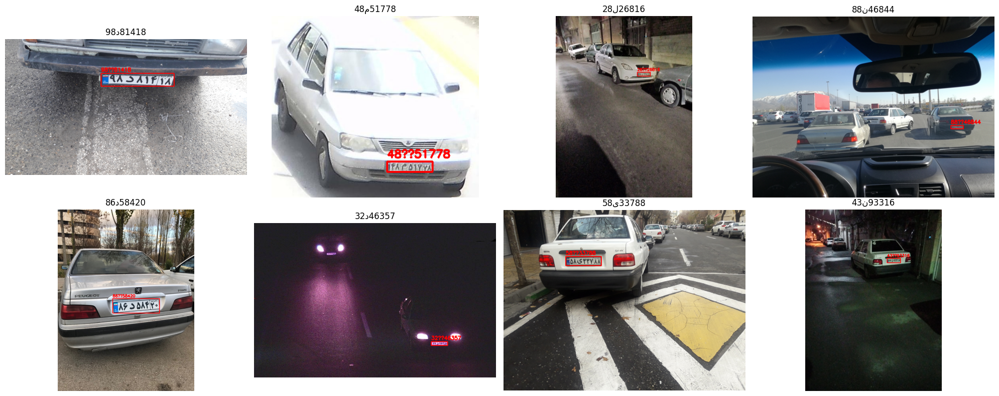

In [66]:

e2e_model = LPRD_E2E(LPD_model, LPR_model, device)

val_dir = '/content/IR-LPD/images/val'
sample_names = random.sample(os.listdir(val_dir), 8)

fig, axes = plt.subplots(2, 4, figsize=(20, 8))
axes = axes.flatten()

for ax, img_name in zip(axes, sample_names):
    img_path = os.path.join(val_dir, img_name)
    pred, box = e2e_model.detect_and_recognize(img_path)
    e2e_model.visualize_results(img_path, pred, box, ax=ax)

plt.tight_layout()
plt.show()

In [67]:
def evaluate_model(model, val_dir, label_csv):
    labels_df = pd.read_csv(label_csv)
    files = os.listdir(val_dir)

    hits = seen = char_err = char_total = 0

    for fname in tqdm(files, desc="Evaluating"):
        fpath = os.path.join(val_dir, fname)
        gt_labels = labels_df.loc[labels_df["image_path"] == fname, "label"].tolist()

        pred, _ = model.detect_and_recognize(fpath)
        seen += 1

        if pred is None:
            continue

        if pred in gt_labels:
            hits += 1

        for gt in gt_labels:
            char_err += sum(a != b for a, b in zip(gt, pred))
            char_total += len(gt)

    accuracy = 100.0 * hits / seen if seen else 0.0
    cer = 100.0 * char_err / char_total if char_total else 0.0

    print(f"\naccuracy: {accuracy:.2f}%")
    print(f"character_error_rate: {cer:.2f}%")

In [68]:
VAL_DIR = "/content/IR-LPD/images/val"
LABEL_CSV = "/content/IR-LPD/plate_labels.csv"

evaluate_model(e2e_model, VAL_DIR, LABEL_CSV)


Evaluating: 100%|██████████| 1251/1251 [01:03<00:00, 19.78it/s]


accuracy: 82.89%
character_error_rate: 4.13%
